# Import Libraries, Load DataSet, Clean DataSet

In [368]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler 
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics import accuracy_score

# import data
filename = "C:\\Users\\Jeremy_Constantin\\Desktop\\Data_Jeremy.csv"
df = pd.read_csv(filename)
df['Age'] = df['Age'].astype('bool')
#df['Re-readigng'] = df['Re-readigng'].astype('bool')
df = df.fillna(df.mean())
df
df['GazeEventDuration'] = df['GazeEventDuration'].astype('int')
df['Blink_Counter'] = df['Blink_Counter'].astype('int')
#Droping Columns that have very low correlations with our target
df.drop('Unnamed: 0', axis=1, inplace=True)
df.drop('Start_Timestamp', axis=1, inplace=True)
df.drop('RecordingTimestamp', axis=1, inplace=True)
df.drop('Timestamp_n', axis=1, inplace=True)
df

C:\Users\Jeremy_Constantin\AppData\Local\Temp\ipykernel_55688\3184913995.py:15: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df = df.fillna(df.mean())


,ParticipantName,Blink_Counter,left_avg_pupil_dill,FixationIndex,SaccadeIndex,GazeEventDuration,FixationPointX (MCSpx),FixationPointY (MCSpx),SaccadicAmplitude,AbsoluteSaccadicDirection,RelativeSaccadicDirection,StrictAverageGazePointX (ADCSmm),StrictAverageGazePointY (ADCSmm),PupilLeft,PupilRight,fix_duration,Age,Average_Grade
0,o01.01.A,3037,-2.069561e-06,1923.849646,3727.393615,10190,590.726148,1769.699688,4.698454,170.010667,176.763975,1011.139703,642.935372,4.012156,3.594565,148.917205,True,0.604101
1,o02.01.A,2343,-2.628735e-06,1955.450345,2682.489554,420,611.353925,437.670823,5.178353,192.294595,180.570159,1047.203635,569.357828,4.800838,5.002688,142.892495,True,0.363703
2,o03.01.A,5455,-4.339637e-06,2040.530155,3167.136285,371,593.692993,1744.547666,3.912831,174.481227,177.995849,1049.849693,549.000129,5.382580,4.920290,141.628203,True,0.582695
3,o04.02.A,63,4.963551e-08,4809.399911,7401.217459,410,594.793215,1643.492317,4.735077,173.526598,183.534568,1076.755042,625.691390,3.133993,3.045703,160.179908,True,0.631835
4,o05.02.A,1844,-2.646829e-06,2264.712946,7063.154909,432,555.663473,1255.340345,4.134132,185.469241,178.015898,1000.450549,603.562908,3.556163,3.522000,141.178892,True,0.534927
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
68,y36.02.A,2519,-9.484141e-06,889.351359,3712.775818,378,676.962277,1194.374588,6.019104,174.316760,177.115445,1181.211972,714.672915,4.427430,4.191877,154.693259,False,0.495673
69,y37.02.A,569,-7.170527e-08,1864.115157,2467.908383,559,579.261314,1541.655173,5.162107,176.814551,178.349855,1005.182295,562.419290,4.703232,4.585717,150.864476,False,0.568978
70,y38.01.A,394,4.105912e-06,1772.701999,2176.515095,484,634.042829,1547.371365,6.662839,179.211979,178.359555,1071.060093,597.882063,3.075016,3.534257,147.848270,False,0.627231
71,y40.04.A,367,1.041408e-06,1937.950781,2448.516270,463,596.710381,1527.445996,4.520297,178.907510,175.094247,1033.819966,641.096833,4.159684,4.651945,150.971647,False,0.733093


In [369]:
filename = "C:\\Users\\Jeremy_Constantin\\Desktop\\Sleep_hours.csv"

df2 = pd.read_csv(filename, sep = ';')
df = df2.merge(df,how="right",on="ParticipantName")
df
#df['Blink_Counter'] = df['Blink_Counter'].astype('int')

,ParticipantName,LanguagesSpoken,SleepHours,NewLanguageLearning,MemoryTraining,EducationalLevel,Blink_Counter,left_avg_pupil_dill,FixationIndex,SaccadeIndex,...,SaccadicAmplitude,AbsoluteSaccadicDirection,RelativeSaccadicDirection,StrictAverageGazePointX (ADCSmm),StrictAverageGazePointY (ADCSmm),PupilLeft,PupilRight,fix_duration,Age,Average_Grade
0,o01.01.A,3.0,2.0,Y,Y,7.0,3037,-2.069561e-06,1923.849646,3727.393615,...,4.698454,170.010667,176.763975,1011.139703,642.935372,4.012156,3.594565,148.917205,True,0.604101
1,o02.01.A,4.0,3.0,Y,Y,5.0,2343,-2.628735e-06,1955.450345,2682.489554,...,5.178353,192.294595,180.570159,1047.203635,569.357828,4.800838,5.002688,142.892495,True,0.363703
2,o03.01.A,4.0,2.0,N,Y,7.0,5455,-4.339637e-06,2040.530155,3167.136285,...,3.912831,174.481227,177.995849,1049.849693,549.000129,5.382580,4.920290,141.628203,True,0.582695
3,o04.02.A,2.0,2.0,N,Y,6.0,63,4.963551e-08,4809.399911,7401.217459,...,4.735077,173.526598,183.534568,1076.755042,625.691390,3.133993,3.045703,160.179908,True,0.631835
4,o05.02.A,3.0,3.0,Y,Y,6.0,1844,-2.646829e-06,2264.712946,7063.154909,...,4.134132,185.469241,178.015898,1000.450549,603.562908,3.556163,3.522000,141.178892,True,0.534927
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
71,y36.02.A,3.0,3.0,N,N,6.0,2519,-9.484141e-06,889.351359,3712.775818,...,6.019104,174.316760,177.115445,1181.211972,714.672915,4.427430,4.191877,154.693259,False,0.495673
72,y37.02.A,1.0,2.0,Y,N,6.0,569,-7.170527e-08,1864.115157,2467.908383,...,5.162107,176.814551,178.349855,1005.182295,562.419290,4.703232,4.585717,150.864476,False,0.568978
73,y38.01.A,3.0,3.0,Y,N,5.0,394,4.105912e-06,1772.701999,2176.515095,...,6.662839,179.211979,178.359555,1071.060093,597.882063,3.075016,3.534257,147.848270,False,0.627231
74,y40.04.A,1.0,2.0,Y,N,4.0,367,1.041408e-06,1937.950781,2448.516270,...,4.520297,178.907510,175.094247,1033.819966,641.096833,4.159684,4.651945,150.971647,False,0.733093


# Treating and Scaling Variables for the Machine learning Process

In [370]:
def condition(x):
    if x == "Y":
        return True
    else :
        return False
    
df['NewLanguageLearning'] = df['NewLanguageLearning'].apply(condition)
df['MemoryTraining'] = df['MemoryTraining'].apply(condition)
df

,ParticipantName,LanguagesSpoken,SleepHours,NewLanguageLearning,MemoryTraining,EducationalLevel,Blink_Counter,left_avg_pupil_dill,FixationIndex,SaccadeIndex,...,SaccadicAmplitude,AbsoluteSaccadicDirection,RelativeSaccadicDirection,StrictAverageGazePointX (ADCSmm),StrictAverageGazePointY (ADCSmm),PupilLeft,PupilRight,fix_duration,Age,Average_Grade
0,o01.01.A,3.0,2.0,True,True,7.0,3037,-2.069561e-06,1923.849646,3727.393615,...,4.698454,170.010667,176.763975,1011.139703,642.935372,4.012156,3.594565,148.917205,True,0.604101
1,o02.01.A,4.0,3.0,True,True,5.0,2343,-2.628735e-06,1955.450345,2682.489554,...,5.178353,192.294595,180.570159,1047.203635,569.357828,4.800838,5.002688,142.892495,True,0.363703
2,o03.01.A,4.0,2.0,False,True,7.0,5455,-4.339637e-06,2040.530155,3167.136285,...,3.912831,174.481227,177.995849,1049.849693,549.000129,5.382580,4.920290,141.628203,True,0.582695
3,o04.02.A,2.0,2.0,False,True,6.0,63,4.963551e-08,4809.399911,7401.217459,...,4.735077,173.526598,183.534568,1076.755042,625.691390,3.133993,3.045703,160.179908,True,0.631835
4,o05.02.A,3.0,3.0,True,True,6.0,1844,-2.646829e-06,2264.712946,7063.154909,...,4.134132,185.469241,178.015898,1000.450549,603.562908,3.556163,3.522000,141.178892,True,0.534927
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
71,y36.02.A,3.0,3.0,False,False,6.0,2519,-9.484141e-06,889.351359,3712.775818,...,6.019104,174.316760,177.115445,1181.211972,714.672915,4.427430,4.191877,154.693259,False,0.495673
72,y37.02.A,1.0,2.0,True,False,6.0,569,-7.170527e-08,1864.115157,2467.908383,...,5.162107,176.814551,178.349855,1005.182295,562.419290,4.703232,4.585717,150.864476,False,0.568978
73,y38.01.A,3.0,3.0,True,False,5.0,394,4.105912e-06,1772.701999,2176.515095,...,6.662839,179.211979,178.359555,1071.060093,597.882063,3.075016,3.534257,147.848270,False,0.627231
74,y40.04.A,1.0,2.0,True,False,4.0,367,1.041408e-06,1937.950781,2448.516270,...,4.520297,178.907510,175.094247,1033.819966,641.096833,4.159684,4.651945,150.971647,False,0.733093


In [371]:
#print(df.columns.values)
#df = df.astype({'LanguagesSpoken':'float'})
df['LanguagesSpoken'] = pd.to_numeric(df['LanguagesSpoken'])
df['SleepHours'] = pd.to_numeric(df['SleepHours'])
df['EducationalLevel'] = pd.to_numeric(df['EducationalLevel'])
df['left_avg_pupil_dill'] = pd.to_numeric(df['left_avg_pupil_dill'], downcast="float")
df = df.fillna(df.mean())
from sklearn import preprocessing
numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
min_max_scaler = preprocessing.MinMaxScaler()
x_scaled = min_max_scaler.fit_transform(df.select_dtypes(include=numerics))
normalized_df = pd.DataFrame(x_scaled, columns = df.select_dtypes(include=numerics).columns)

C:\Users\Jeremy_Constantin\AppData\Local\Temp\ipykernel_55688\1803466552.py:7: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df = df.fillna(df.mean())


# Correlation Matrix + HeatMap (Basic Dataste + Normalized Dataset)

C:\Users\Jeremy_Constantin\AppData\Local\Temp\ipykernel_55688\2413086556.py:4: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  sns.heatmap(corr, mask=np.zeros_like(corr, dtype=np.bool),


<AxesSubplot:>

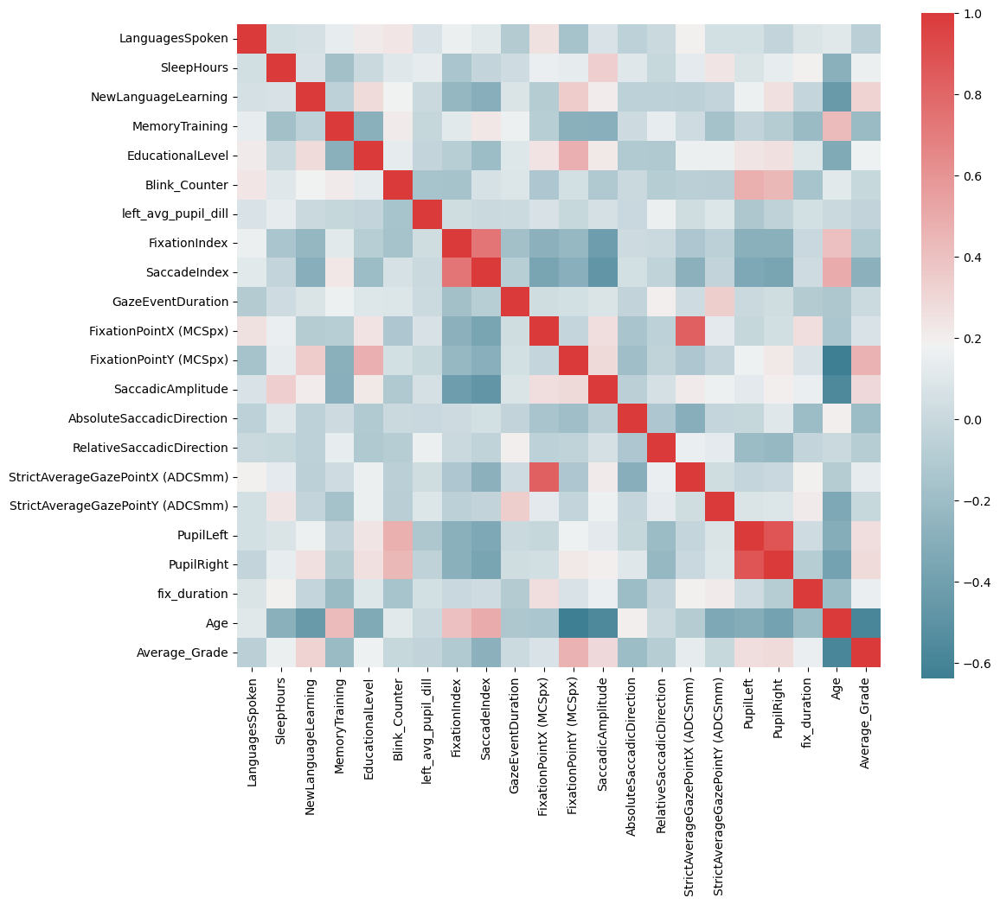

In [372]:
# run correlation matrix and plot on Base Dataset
f, ax = plt.subplots(figsize=(12, 10))
corr = df.corr()
sns.heatmap(corr, mask=np.zeros_like(corr, dtype=np.bool),
            cmap=sns.diverging_palette(220, 12, as_cmap=True),
            square=True, ax=ax)

C:\Users\Jeremy_Constantin\AppData\Local\Temp\ipykernel_55688\4244013.py:4: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  sns.heatmap(corr, mask=np.zeros_like(corr, dtype=np.bool),


<AxesSubplot:>

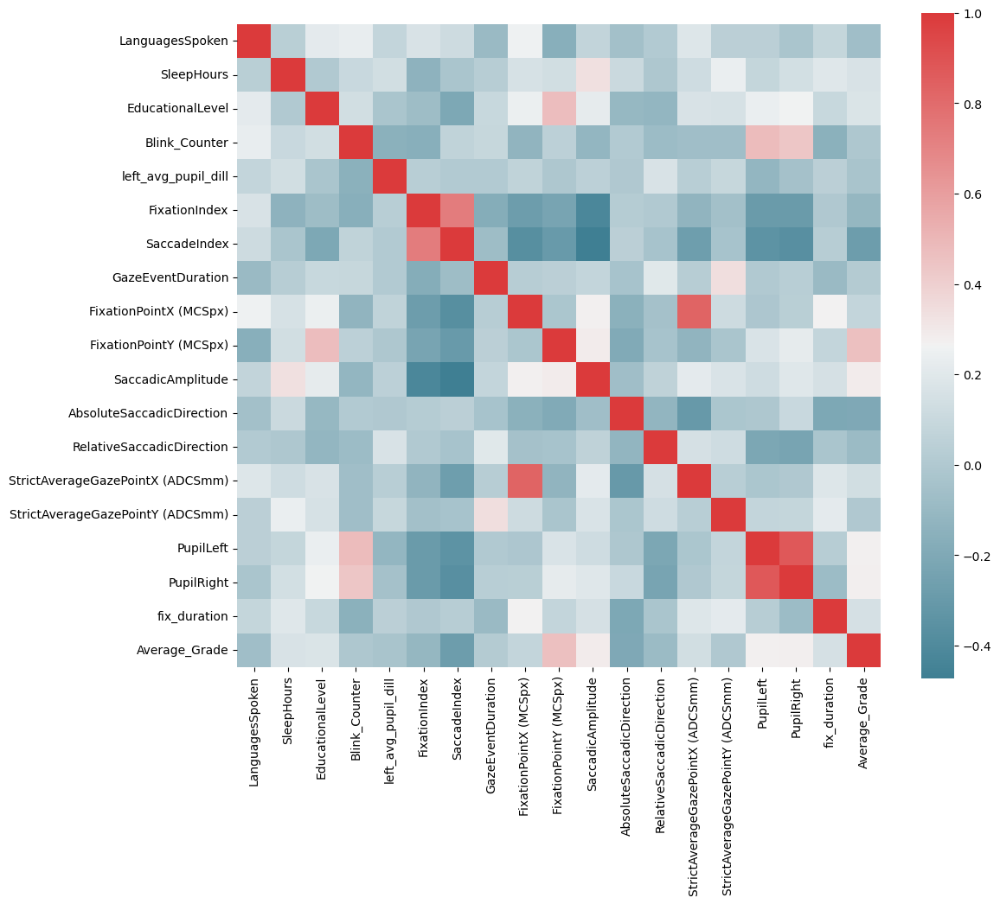

In [373]:
# run correlation matrix and plot on Normalized Dataset
f, ax = plt.subplots(figsize=(12, 10))
corr = normalized_df.corr()
sns.heatmap(corr, mask=np.zeros_like(corr, dtype=np.bool),
            cmap=sns.diverging_palette(220, 12, as_cmap=True),
            square=True, ax=ax)

In [374]:
corr

,LanguagesSpoken,SleepHours,EducationalLevel,Blink_Counter,left_avg_pupil_dill,FixationIndex,SaccadeIndex,GazeEventDuration,FixationPointX (MCSpx),FixationPointY (MCSpx),SaccadicAmplitude,AbsoluteSaccadicDirection,RelativeSaccadicDirection,StrictAverageGazePointX (ADCSmm),StrictAverageGazePointY (ADCSmm),PupilLeft,PupilRight,fix_duration,Average_Grade
LanguagesSpoken,1.000000,0.034452,0.212986,0.234222,0.075155,0.161464,0.115130,-0.096690,0.255799,-0.163270,0.072236,-0.053904,0.005487,0.188757,0.040877,0.041899,-0.027653,0.082852,-0.067864
SleepHours,0.034452,1.000000,0.004369,0.100721,0.134053,-0.142945,-0.028408,0.024186,0.154651,0.131919,0.335353,0.102977,-0.007591,0.125178,0.240253,0.080316,0.141130,0.190303,0.161249
EducationalLevel,0.212986,0.004369,1.000000,0.134404,-0.029263,-0.078942,-0.207836,0.093209,0.244960,0.472520,0.221609,-0.108653,-0.119586,0.160359,0.155537,0.239869,0.258438,0.095414,0.174318
Blink_Counter,0.234222,0.100721,0.134404,1.000000,-0.153684,-0.163639,0.064131,0.087295,-0.127463,0.046301,-0.119030,0.007522,-0.083735,-0.068060,-0.069195,0.477054,0.438422,-0.153727,-0.007181
left_avg_pupil_dill,0.075155,0.134053,-0.029263,-0.153684,1.000000,0.030377,0.005789,0.010356,0.066814,-0.006784,0.048070,-0.004263,0.160809,0.032845,0.090575,-0.120262,-0.047886,0.045006,-0.034684
FixationIndex,0.161464,-0.142945,-0.078942,-0.163639,0.030377,1.000000,0.734866,-0.175698,-0.277166,-0.233131,-0.419679,0.018274,0.004029,-0.127995,-0.057609,-0.292430,-0.289919,-0.001822,-0.110611
SaccadeIndex,0.115130,-0.028408,-0.207836,0.064131,0.005789,0.734866,1.000000,-0.081218,-0.368845,-0.296692,-0.472356,0.044860,-0.040744,-0.274088,-0.036128,-0.343821,-0.364814,0.027072,-0.278092
GazeEventDuration,-0.096690,0.024186,0.093209,0.087295,0.010356,-0.175698,-0.081218,1.000000,0.027908,0.043121,0.079655,-0.036719,0.196255,0.025710,0.341559,0.003819,0.028886,-0.097259,0.011950
FixationPointX (MCSpx),0.255799,0.154651,0.244960,-0.127463,0.066814,-0.277166,-0.368845,0.027908,1.000000,-0.023027,0.271855,-0.151596,-0.049608,0.827780,0.118274,-0.012320,0.035570,0.269473,0.075580
FixationPointY (MCSpx),-0.163270,0.131919,0.472520,0.046301,-0.006784,-0.233131,-0.296692,0.043121,-0.023027,1.000000,0.286832,-0.195697,-0.039961,-0.128665,-0.027022,0.168154,0.220412,0.076866,0.462847


# Importing Librairies for Machine Learning + Defining X and Y 

In [375]:
import scipy
import statsmodels.formula.api as smf
import statsmodels.api as sm
from sklearn import model_selection, preprocessing, feature_selection, ensemble, linear_model, metrics, decomposition
#from lime import lime_tabular
from sklearn.model_selection import train_test_split

In [376]:
X = df.loc[:, df.columns != 'Average_Grade']
X = X.drop(['ParticipantName'], axis=1)
X

,LanguagesSpoken,SleepHours,NewLanguageLearning,MemoryTraining,EducationalLevel,Blink_Counter,left_avg_pupil_dill,FixationIndex,SaccadeIndex,GazeEventDuration,...,FixationPointY (MCSpx),SaccadicAmplitude,AbsoluteSaccadicDirection,RelativeSaccadicDirection,StrictAverageGazePointX (ADCSmm),StrictAverageGazePointY (ADCSmm),PupilLeft,PupilRight,fix_duration,Age
0,3.0,2.0,True,True,7.0,3037,-2.069561e-06,1923.849646,3727.393615,10190,...,1769.699688,4.698454,170.010667,176.763975,1011.139703,642.935372,4.012156,3.594565,148.917205,True
1,4.0,3.0,True,True,5.0,2343,-2.628735e-06,1955.450345,2682.489554,420,...,437.670823,5.178353,192.294595,180.570159,1047.203635,569.357828,4.800838,5.002688,142.892495,True
2,4.0,2.0,False,True,7.0,5455,-4.339637e-06,2040.530155,3167.136285,371,...,1744.547666,3.912831,174.481227,177.995849,1049.849693,549.000129,5.382580,4.920290,141.628203,True
3,2.0,2.0,False,True,6.0,63,4.963551e-08,4809.399911,7401.217459,410,...,1643.492317,4.735077,173.526598,183.534568,1076.755042,625.691390,3.133993,3.045703,160.179908,True
4,3.0,3.0,True,True,6.0,1844,-2.646829e-06,2264.712946,7063.154909,432,...,1255.340345,4.134132,185.469241,178.015898,1000.450549,603.562908,3.556163,3.522000,141.178892,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
71,3.0,3.0,False,False,6.0,2519,-9.484141e-06,889.351359,3712.775818,378,...,1194.374588,6.019104,174.316760,177.115445,1181.211972,714.672915,4.427430,4.191877,154.693259,False
72,1.0,2.0,True,False,6.0,569,-7.170527e-08,1864.115157,2467.908383,559,...,1541.655173,5.162107,176.814551,178.349855,1005.182295,562.419290,4.703232,4.585717,150.864476,False
73,3.0,3.0,True,False,5.0,394,4.105912e-06,1772.701999,2176.515095,484,...,1547.371365,6.662839,179.211979,178.359555,1071.060093,597.882063,3.075016,3.534257,147.848270,False
74,1.0,2.0,True,False,4.0,367,1.041408e-06,1937.950781,2448.516270,463,...,1527.445996,4.520297,178.907510,175.094247,1033.819966,641.096833,4.159684,4.651945,150.971647,False


In [377]:
#y = df[['ParticipantName','Results']]
y = df[['Average_Grade']]
y
#y = y.ravel()

,Average_Grade
0,0.604101
1,0.363703
2,0.582695
3,0.631835
4,0.534927
...,...
71,0.495673
72,0.568978
73,0.627231
74,0.733093


# Encoding our Target for Classification

In [378]:
def condition(x):
    if x>0.85:
        return "A"
    elif x>=0.7 and x<=0.85:
        return "B"
    elif x< 0.7 and x>=0.5 :
        return 'C'
    elif x< 0.5 and x>=0.3 :
        return 'D'
    else :
        #return 'C'
        return 'D'
    
temp = df[['Average_Grade']]
temp = pd.DataFrame(temp,columns = ['Average_Grade'])
temp['Average_Grade'] = y['Average_Grade'].apply(condition)
y = temp

from sklearn.preprocessing import LabelEncoder
print("before encoding :", y)
# Create the encoder
le = LabelEncoder()

# Encode the classes
y = le.fit_transform(y)
print("Classes Encoded:", y)

before encoding :    Average_Grade
0              C
1              D
2              C
3              C
4              C
..           ...
71             D
72             C
73             C
74             B
75             B

[76 rows x 1 columns]
Classes Encoded: [1 2 1 1 1 1 2 1 1 2 2 1 2 2 2 1 2 2 1 2 1 2 1 1 2 2 1 1 2 2 2 1 1 1 2 1 2
 2 1 1 0 0 1 1 0 1 1 0 1 1 0 0 1 1 0 0 0 1 1 1 2 2 1 0 1 1 2 1 0 0 0 2 1 1
 0 0]


C:\Users\Jeremy_Constantin\anaconda3\lib\site-packages\sklearn\preprocessing\_label.py:115: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


# Train-Test Split + scaling

In [379]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)
scaler = StandardScaler()
scaler.fit(X_train)

X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test) 

X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test) 
y

array([1, 2, 1, 1, 1, 1, 2, 1, 1, 2, 2, 1, 2, 2, 2, 1, 2, 2, 1, 2, 1, 2,
       1, 1, 2, 2, 1, 1, 2, 2, 2, 1, 1, 1, 2, 1, 2, 2, 1, 1, 0, 0, 1, 1,
       0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1, 2, 2, 1, 0, 1, 1,
       2, 1, 0, 0, 0, 2, 1, 1, 0, 0])

In [380]:
X

,LanguagesSpoken,SleepHours,NewLanguageLearning,MemoryTraining,EducationalLevel,Blink_Counter,left_avg_pupil_dill,FixationIndex,SaccadeIndex,GazeEventDuration,...,FixationPointY (MCSpx),SaccadicAmplitude,AbsoluteSaccadicDirection,RelativeSaccadicDirection,StrictAverageGazePointX (ADCSmm),StrictAverageGazePointY (ADCSmm),PupilLeft,PupilRight,fix_duration,Age
0,3.0,2.0,True,True,7.0,3037,-2.069561e-06,1923.849646,3727.393615,10190,...,1769.699688,4.698454,170.010667,176.763975,1011.139703,642.935372,4.012156,3.594565,148.917205,True
1,4.0,3.0,True,True,5.0,2343,-2.628735e-06,1955.450345,2682.489554,420,...,437.670823,5.178353,192.294595,180.570159,1047.203635,569.357828,4.800838,5.002688,142.892495,True
2,4.0,2.0,False,True,7.0,5455,-4.339637e-06,2040.530155,3167.136285,371,...,1744.547666,3.912831,174.481227,177.995849,1049.849693,549.000129,5.382580,4.920290,141.628203,True
3,2.0,2.0,False,True,6.0,63,4.963551e-08,4809.399911,7401.217459,410,...,1643.492317,4.735077,173.526598,183.534568,1076.755042,625.691390,3.133993,3.045703,160.179908,True
4,3.0,3.0,True,True,6.0,1844,-2.646829e-06,2264.712946,7063.154909,432,...,1255.340345,4.134132,185.469241,178.015898,1000.450549,603.562908,3.556163,3.522000,141.178892,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
71,3.0,3.0,False,False,6.0,2519,-9.484141e-06,889.351359,3712.775818,378,...,1194.374588,6.019104,174.316760,177.115445,1181.211972,714.672915,4.427430,4.191877,154.693259,False
72,1.0,2.0,True,False,6.0,569,-7.170527e-08,1864.115157,2467.908383,559,...,1541.655173,5.162107,176.814551,178.349855,1005.182295,562.419290,4.703232,4.585717,150.864476,False
73,3.0,3.0,True,False,5.0,394,4.105912e-06,1772.701999,2176.515095,484,...,1547.371365,6.662839,179.211979,178.359555,1071.060093,597.882063,3.075016,3.534257,147.848270,False
74,1.0,2.0,True,False,4.0,367,1.041408e-06,1937.950781,2448.516270,463,...,1527.445996,4.520297,178.907510,175.094247,1033.819966,641.096833,4.159684,4.651945,150.971647,False


# Basic Knn Model 

In [381]:
# Use the KNN classifier to fit data:
classifier = KNeighborsClassifier(n_neighbors=5)
classifier.fit(X_train, y_train) 

# Predict y data with classifier: 
y_predict = classifier.predict(X_test)

# Print results: 
print(confusion_matrix(y_test, y_predict))
print(classification_report(y_test, y_predict))
accuracy_score(y_test, y_predict)

[[3 2 0]
 [3 7 4]
 [0 4 3]]
              precision    recall  f1-score   support

           0       0.50      0.60      0.55         5
           1       0.54      0.50      0.52        14
           2       0.43      0.43      0.43         7

    accuracy                           0.50        26
   macro avg       0.49      0.51      0.50        26
weighted avg       0.50      0.50      0.50        26



C:\Users\Jeremy_Constantin\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)


0.5

In [382]:
print(y_test)
print(y_predict)

[1 1 2 1 1 0 1 1 0 2 1 0 1 2 1 1 2 1 2 1 2 0 1 2 1 0]
[1 2 1 0 1 1 1 0 1 1 2 0 2 1 1 1 1 0 2 2 2 0 1 2 1 0]


# Basic SVM model 

In [383]:
import pandas as pd
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn import svm
SVC_model = svm.SVC()

SVC_model.fit(X_train, y_train)

SVC_prediction = SVC_model.predict(X_test)

# Accuracy score is the simplest way to evaluate
print(accuracy_score(SVC_prediction, y_test))

# But Confusion Matrix and Classification Report give more details about performance
print(confusion_matrix(SVC_prediction, y_test))
print(classification_report(SVC_prediction, y_test))

0.5
[[3 1 0]
 [2 9 6]
 [0 4 1]]
              precision    recall  f1-score   support

           0       0.60      0.75      0.67         4
           1       0.64      0.53      0.58        17
           2       0.14      0.20      0.17         5

    accuracy                           0.50        26
   macro avg       0.46      0.49      0.47        26
weighted avg       0.54      0.50      0.51        26



In [384]:
# Cross-Validation SVM
from sklearn.model_selection import StratifiedShuffleSplit
C_range = np.logspace(-3, 3, 7)
gamma_range = np.logspace(-3, 3, 7)
param_grid = dict(gamma=gamma_range, C=C_range)

model=SVC()
cv = StratifiedShuffleSplit(n_splits=5, test_size=0.2, random_state=42)
grid = GridSearchCV(SVC_model, param_grid=param_grid, cv=cv,n_jobs=-1)
best_svc = grid.fit(X_train, y_train)
grid.fit(X_train, y_train)
# print the best hyperparameter
print("Best Hyperparameter (number of trees):", grid.best_params_)
# print the training CV accuracy score
print("Training CV Accuracy Score:", grid.best_score_)
# print the test accuracy score
print("Test Accuracy Score:", grid.score(X_test, y_test))

Best Hyperparameter (number of trees): {'C': 10.0, 'gamma': 0.001}
Training CV Accuracy Score: 0.5399999999999999
Test Accuracy Score: 0.46153846153846156


In [385]:
from sklearn.calibration import calibration_curve
best_svc = svm.SVC(kernel='linear', C=10, gamma=0.001,probability=True)
best_svc.fit(X_train, y_train)

SVC(C=10, gamma=0.001, kernel='linear', probability=True)

# Random Forest Model + HyperParameter

In [386]:
from sklearn.model_selection import train_test_split
lab = preprocessing.LabelEncoder()
#y = lab.fit_transform(y)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=44)
from sklearn.ensemble import RandomForestClassifier
rf_model = RandomForestClassifier(n_estimators=50, max_features="auto", random_state=44)
rf_model.fit(X_train, y_train)

predictions = rf_model.predict(X_test)

print(accuracy_score(predictions, y_test))
print(predictions)
print(y_test)

0.21739130434782608
[1 1 1 0 2 2 1 2 1 1 0 0 1 1 1 2 1 1 1 2 2 2 2]
[1 0 1 2 1 1 2 1 1 0 1 1 0 0 1 1 2 2 0 1 1 2 1]


In [387]:
# Define the grid for the number of trees
grid = {'n_estimators': np.arange(100,1000,100)}

# Do a grid search to find the optimal number of trees
rf = RandomForestClassifier(random_state = 42)
rf_cv = GridSearchCV(rf, grid, cv=5)
rf_cv.fit(X_train, y_train)

# print the best hyperparameter
print("Best Hyperparameter (number of trees):", rf_cv.best_params_)
# print the training CV accuracy score
print("Training CV Accuracy Score:", rf_cv.best_score_)
# print the test accuracy score
print("Test Accuracy Score:", rf_cv.score(X_test, y_test))

Best Hyperparameter (number of trees): {'n_estimators': 800}
Training CV Accuracy Score: 0.3618181818181818
Test Accuracy Score: 0.391304347826087


# Hyperparameters - Gridsearch - KNN model - Best Model

In [388]:
from sklearn.model_selection import GridSearchCV
leaf_size = list(range(1,50))
n_neighbors = list(range(1,30))
p=[1,2]
#Convert to dictionary
hyperparameters = dict(leaf_size=leaf_size, n_neighbors=n_neighbors, p=p)
#Create new KNN object
knn_2 = KNeighborsClassifier()
#Use GridSearch
clf = GridSearchCV(knn_2, hyperparameters, cv=4)
#Fit the model
best_model = clf.fit(X,temp)
#Print The value of best Hyperparameters
print('Best leaf_size:', best_model.best_estimator_.get_params()['leaf_size'])
print('Best p:', best_model.best_estimator_.get_params()['p'])
print('Best n_neighbors:', best_model.best_estimator_.get_params()['n_neighbors'])

C:\Users\Jeremy_Constantin\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:198: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\Users\Jeremy_Constantin\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
C:\Users\Jeremy_Constantin\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:198: DataConversionWarning: A column-vector y was passed when a 1d array 

Best leaf_size: 1
Best p: 1
Best n_neighbors: 24


C:\Users\Jeremy_Constantin\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
C:\Users\Jeremy_Constantin\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:198: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\Users\Jeremy_Constantin\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurto

In [389]:
print('Best leaf_size:', best_model.best_estimator_.get_params()['leaf_size'])
print('Best p:', best_model.best_estimator_.get_params()['p'])
print('Best n_neighbors:', best_model.best_estimator_.get_params()['n_neighbors'])

Best leaf_size: 1
Best p: 1
Best n_neighbors: 24


In [390]:
y_pred_best = best_model.predict(X_test)
print(y_pred_best)

['C' 'B' 'C' 'C' 'C' 'C' 'C' 'C' 'C' 'C' 'B' 'C' 'C' 'B' 'C' 'D' 'C' 'C'
 'C' 'C' 'C' 'C' 'C']


C:\Users\Jeremy_Constantin\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)


In [391]:
y_pred_best = best_model.predict(X_test)
# Create the encoder
le = LabelEncoder()

# Encode the classes
y_pred_best = le.fit_transform(y_pred_best)
print(classification_report(y_pred_best, y_test))

              precision    recall  f1-score   support

           0       0.40      0.67      0.50         3
           1       0.85      0.58      0.69        19
           2       0.00      0.00      0.00         1

    accuracy                           0.57        23
   macro avg       0.42      0.42      0.40        23
weighted avg       0.75      0.57      0.63        23



C:\Users\Jeremy_Constantin\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)


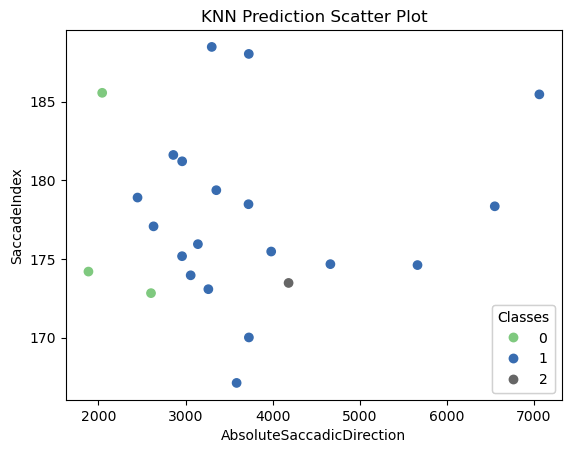

In [392]:
fig, ax = plt.subplots()

scatter = ax.scatter(X_test['SaccadeIndex'], X_test['AbsoluteSaccadicDirection'], c=y_pred_best, cmap='Accent')
plt.xlabel('AbsoluteSaccadicDirection')
plt.ylabel('SaccadeIndex')
plt.title('KNN Prediction Scatter Plot')
legend1 = plt.legend(*scatter.legend_elements(),
                    loc="lower right", title="Classes")
ax.add_artist(legend1)
plt.show()

# Pipeline - model

In [393]:
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression

# create the pipeline
pipe = Pipeline([
    ('classifier', RandomForestClassifier())
])

# create a parameter grid to search over
param_grid = [
    {
        'classifier': [SVC()],
        'classifier__kernel': ['linear', 'rbf'],
        'classifier__C': [0.1, 1, 10],
    },
    {
        'classifier': [RandomForestClassifier()],
        'classifier__n_estimators': [10, 100, 1000],
        'classifier__max_depth': [1, 10, None],
    },
    {
        'classifier': [LogisticRegression()],
        'classifier__penalty': ['none', 'l2'],
        'classifier__C': [0.1, 1, 10],
    }
]

# perform the grid search
grid = GridSearchCV(pipe, param_grid=param_grid, cv=5)
grid.fit(X_train, y_train)

# print the best parameters and best score
print("Best parameters: ", grid.best_params_)
print("Best score: ", grid.best_score_)

C:\Users\Jeremy_Constantin\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
C:\Users\Jeremy_Constantin\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\Jeremy_Constantin\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
C:\Users\Jeremy_Constantin\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: 

Best parameters:  {'classifier': LogisticRegression(C=0.1, penalty='none'), 'classifier__C': 0.1, 'classifier__penalty': 'none'}
Best score:  0.509090909090909


C:\Users\Jeremy_Constantin\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\Jeremy_Constantin\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
C:\Users\Jeremy_Constantin\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https:/